<a href="https://colab.research.google.com/github/NU-MSE-LECTURES/465-WINTER2026/blob/main/Week_05/code_examples/example_08_gold_on_carbon.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Week 05 - Example 08: Multislice TEM of Gold Nanoparticles on Amorphous Carbon

This notebook demonstrates how to simulate a realistic TEM experiment involving **Gold (Au) nanoparticles** supported on a thin **amorphous Carbon** film.

Key concepts:
1.  Generating complex atomic structures:
    *   Creating nanoparticles (clusters) with `ase.cluster`.
    *   Generating amorphous support films (pseudo-random packing).
2.  Combining multiple structures into a single simulation cell.
3.  Simulating the TEM image with realistic imaging conditions (CTF, noise).


In [11]:
import sys
import typing

# --- Patch for Python < 3.11 (Fixes 'Self' error in abtem) ---
if sys.version_info < (3, 11):
    try:
        from typing_extensions import Self
        if not hasattr(typing, "Self"):
            typing.Self = Self
    except ImportError:
        print("Warning: 'typing_extensions' library not found. Please install it with !pip install typing_extensions")
# -------------------------------------------------------------

import abtem
import ase
import ase.cluster
import numpy as np
import matplotlib.pyplot as plt
from ase.visualize import view

## 1. Create Amorphous Carbon Support

Generating a true amorphous structure usually requires Molecular Dynamics (MD) simulations (melting and quenching). For this tutorial, we will approximate an amorphous carbon film by creating a random packing of Carbon atoms within a slab, ensuring atoms do not overlap too closely.

Parameters:
*   Density: ~2.0 g/cm³
*   Thickness: 50 Å
*   Minimum C-C distance: 1.2 Å

Targeting ~10829 Carbon atoms for 30.0 Å slab...
Generated 10976 atoms.


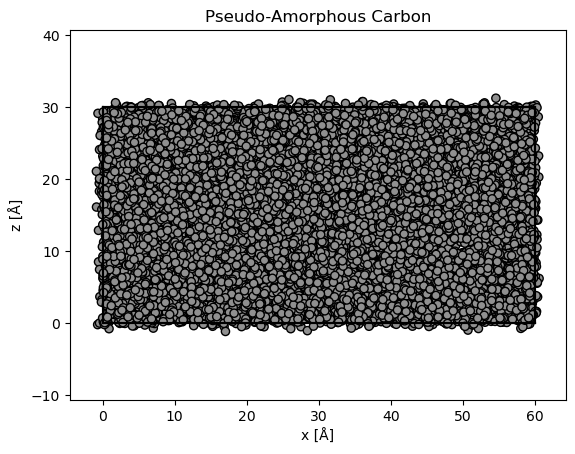

In [12]:
def create_amorphous_carbon(box_x, box_y, thickness, density_g_cm3=2.0):
    """
    Creates a pseudo-amorphous carbon slab by generating a crystalline lattice
    and heavily disordering it (rattling). This prevents atom overlap while 
    mimicking the density and disorder of amorphous carbon.
    """
    import ase.build

    # 1. Create a base crystal (Diamond is too dense, Graphite is closer)
    # Graphite density ~2.26 g/cm3. We can start with diamond and scale it.
    # OR: Start with simple cubic to fill volume easily.
    
    # Let's estimate number of atoms required
    vol_cm3 = (box_x * 1e-8) * (box_y * 1e-8) * (thickness * 1e-8)
    mass_g = vol_cm3 * density_g_cm3
    mass_u = mass_g * 6.022e23
    n_atoms_target = int(mass_u / ase.data.atomic_masses[6])
    
    print(f"Targeting ~{n_atoms_target} Carbon atoms for {thickness} Å slab...")

    # 2. Build a cubic grid of atoms
    # robust method: Diamond cubic, then scale cell to match target density
    atoms = ase.build.bulk('C', 'diamond', cubic=True)
    
    # Current density of diamond ~3.5. We want 2.0. Scale factor ~ (3.5/2.0)^(1/3) ~ 1.2
    scale_factor = (3.5 / density_g_cm3)**(1/3)
    atoms.set_cell(atoms.cell * scale_factor, scale_atoms=True)
    
    # Tile to fill box
    nx = int(np.ceil(box_x / atoms.cell[0,0]))
    ny = int(np.ceil(box_y / atoms.cell[1,1]))
    nz = int(np.ceil(thickness / atoms.cell[2,2]))
    
    atoms = atoms * (nx, ny, nz)
    
    # Crop to exact box size
    atoms.set_cell([box_x, box_y, thickness])
    atoms.center()
    
    # Filter atoms outside the new cell boundaries (since we tiled)
    # Actually, simpler to just keep them all, as set_cell might span slightly larger.
    # Just let abTEM handle potential wrapping or ensure we match periodicity.
    # For amorphous, periodicity is tricky. We'll ignore PBC conflicts for this demo 
    # and just rattle.
    
    # 3. Rattle (Disorder)
    # Displace atoms randomly. Standard dev of 0.5 A is significant disorder.
    atoms.rattle(stdev=0.5, seed=42)
    
    print(f"Generated {len(atoms)} atoms.")
    return atoms

# Define Simulation Box Size
box_size = 60.0 # Angstroms
carbon_thickness = 30.0 # Angstroms

carbon_film = create_amorphous_carbon(box_size, box_size, carbon_thickness)

abtem.show_atoms(carbon_film, title="Pseudo-Amorphous Carbon", plane='xz');

## 2. Create Gold Nanoparticle

We will use the `ase.cluster` module to generate a gold nanoparticle. We can create highly symmetric shapes like an **Icosahedron** or a **Decahedron**, or use a **Wulff construction** for a equilibrium shape.

After generating it, we will **rotate it randomly** to simulate a realistic deposition where particles are not perfectly aligned with the beam.

Gold Nanoparticle Atoms: 1415


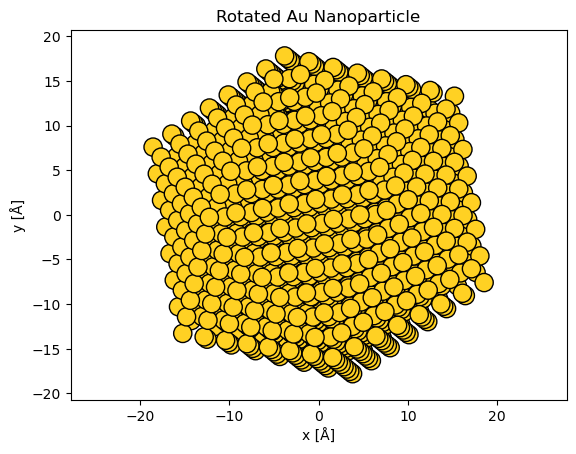

In [16]:
# Generate icosaheral cluster
# noshells determines size. 5 shells => ~147 atoms, 10 shells => ~1000 atoms
gold_np = ase.cluster.Icosahedron('Au', noshells=8)

# Center the NP
gold_np.center() 

# Random Rotation
# Generate random rotation angles
phi = np.random.uniform(0, 360)
theta = np.random.uniform(0, 180)
psi = np.random.uniform(0, 360)

gold_np.rotate(phi, 'x')
gold_np.rotate(theta, 'y')
gold_np.rotate(psi, 'z')

print(f"Gold Nanoparticle Atoms: {len(gold_np)}")
abtem.show_atoms(gold_np, title="Rotated Au Nanoparticle");

## 3. Assemble the Structure

Now we combine the Carbon film and the Gold Nanoparticle into a single `ase.Atoms` object.
We need to ensure the Gold particle sits **on top** of the Carbon film.

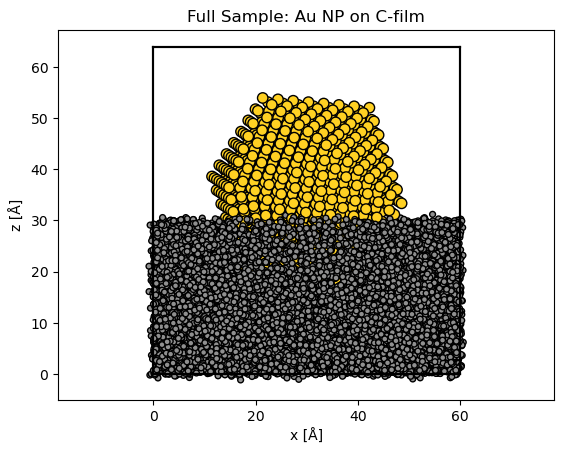

In [18]:
# 1. Start with Carbon simulation cell
full_structure = carbon_film.copy()

# 2. Determine Z-height to place Gold
# Carbon fills z from 0 to 'carbon_thickness'.
# Let's place Gold starting at z = carbon_thickness + 2.0 Å (gap)
z_offset = carbon_thickness -12.0
np_z_min = np.min(gold_np.positions[:, 2])

# Shift Gold positions
gold_positions = gold_np.positions.copy()
# Center X,Y in the box
gold_positions[:, 0] += box_size / 2.0
gold_positions[:, 1] += box_size / 2.0
# Shift Z
gold_positions[:, 2] += (z_offset - np_z_min)

# Add Gold atoms to the structure
gold_atoms_in_box = ase.Atoms(
    symbols=gold_np.get_chemical_symbols(),
    positions=gold_positions
)

full_structure.extend(gold_atoms_in_box)

# Adjust cell height to contain everything + vacuum
z_max = np.max(full_structure.positions[:, 2])
full_structure.set_cell([box_size, box_size, z_max + 10.0])

# Static Plot (Side View)
abtem.show_atoms(full_structure, title="Full Sample: Au NP on C-film", plane='xz');

In [19]:
# Visualization: Create an animation rotating around the Z axis
from matplotlib import animation
from IPython.display import HTML

fig, ax = plt.subplots(figsize=(6, 6))
plt.close(fig) # Prevent static display

def animate(i):
    ax.clear()
    # Rotate a copy of the structure
    # Rotate around the center of the box (xy) to keep it in frame
    rotated = full_structure.copy()
    center_point = (box_size / 2, box_size / 2, 0)
    rotated.rotate(i * 10, 'z', center=center_point)
    
    abtem.show_atoms(
        rotated, 
        ax=ax, 
        title=f"Sample Rotation: {i*10}°", 
        plane='xz' # Side view to see the particle on top
    )

print("Generating animation (this may take a minute)...")
# Reduced frames to 36 (every 10 degrees) for faster rendering
anim = animation.FuncAnimation(fig, animate, frames=36, interval=100)
HTML(anim.to_jshtml())

Generating animation (this may take a minute)...


## 4. Run Multislice Simulation

We will generate the projected potential and propagate a plane wave (TEM mode) through the sample.

Building potential...
Potential shape: (16, 600, 600)


tasks:   0%|          | 0/2 [00:00<?, ?it/s]

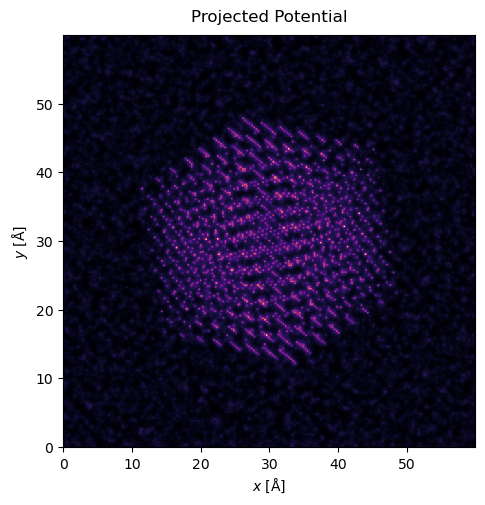

In [23]:
# 1. Generate Potential
# Using frozen phonons for Au is expensive/heavy if we just want a quick structural image.
# We will use static potential for speed in this demo, or a small number of phonons.
# Let's use static (num_configs=1) for the main demo to keep it fast.

potential = abtem.Potential(
    full_structure,
    sampling=0.1,         # 0.1 Å/pixel
    slice_thickness=4.0,  # Slice thickness
    parametrization='kirkland',
)

print("Building potential...")
potential_array = potential.build()
print(f"Potential shape: {potential_array.shape}")

# Show projected potential
potential.project().show(cmap='magma', title="Projected Potential");

tasks:   0%|          | 0/4 [00:00<?, ?it/s]

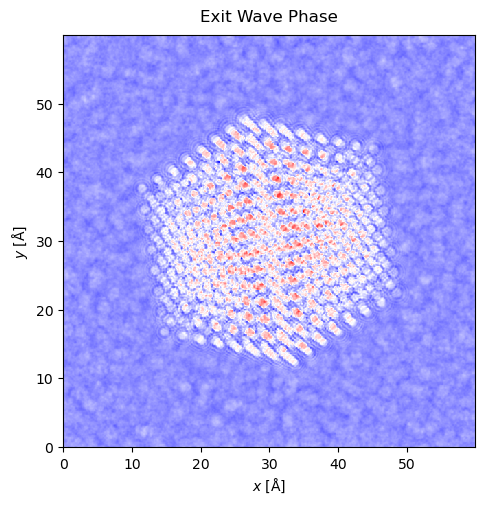

In [24]:
# 2. Propagate Wave
# 300 kV electrons
wave = abtem.PlaneWave(energy=300e3)
exit_wave = wave.multislice(potential)

# Show Exit Wave Phase (often shows atomic columns well)
exit_wave.phase().show(cmap='bwr', title="Exit Wave Phase");

## 5. Simulate TEM Image (CTF)

The exit wave is not what we see. We see intensity after the wave passes through the lens system (CTF).
We will simulate a standard HRTEM condition:
*   Spherical Aberration ($C_s$): 1.2 mm
*   Defocus ($\Delta f$): close to Scherzer defocus

Scherzer Defocus: 595.3 Å


tasks:   0%|          | 0/4 [00:00<?, ?it/s]

tasks:   0%|          | 0/4 [00:00<?, ?it/s]

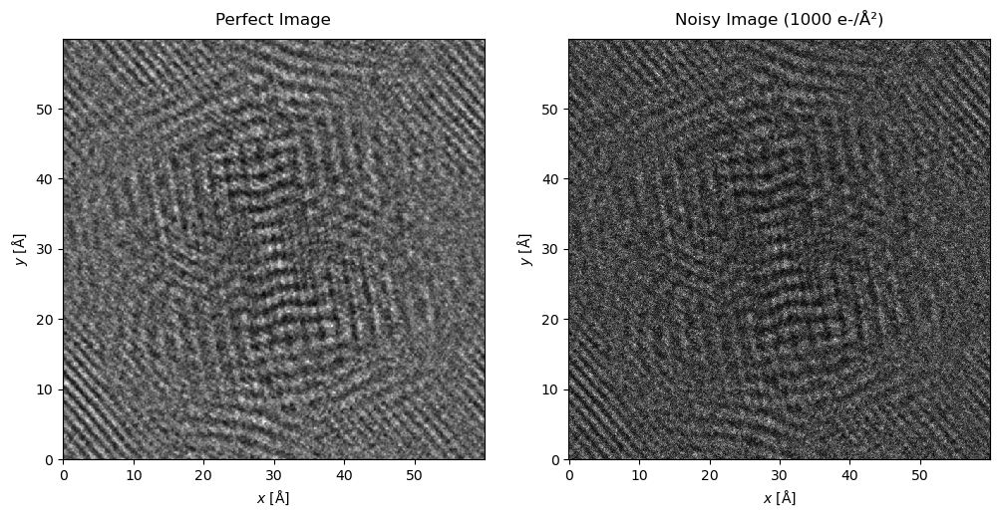

In [25]:
# Define CTF
Cs = 1.2 * 1e7 # 1.2 mm in Angstroms
defocus = abtem.transfer.scherzer_defocus(energy=300e3, Cs=Cs)
print(f"Scherzer Defocus: {defocus:.1f} Å")

ctf = abtem.CTF(
    energy=300e3,
    C10=defocus, # Defocus
    C30=Cs,      # Cs
)

image_wave = exit_wave.apply_ctf(ctf)
image_intensity = image_wave.intensity()

# Add Camera Noise (Poisson)
dose = 1000 # electrons / Å^2 (High dose)
noisy_image = image_intensity.poisson_noise(dose_per_area=dose)

# Plot
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
image_intensity.show(ax=ax[0], cmap='gray', title="Perfect Image")
noisy_image.show(ax=ax[1], cmap='gray', title=f"Noisy Image ({dose} e-/Å²)")

## 6. Advanced Aberrations

Real microscopes often have residual geometric aberrations beyond just Defocus and Spherical Aberration. Here we simulate the effect of:
*   **Two-fold Astigmatism ($C_{12}$)**: Causes the Thon rings to become elliptical and the features to streak in one direction.
*   **Coma ($B_{2}$)**: Causes asymmetry in atomic columns (tails).

We can add these coefficients to `abtem.CTF`. Magnitudes are usually small in corrected microscopes, but we exaggerate them here for visibility.

tasks:   0%|          | 0/4 [00:00<?, ?it/s]

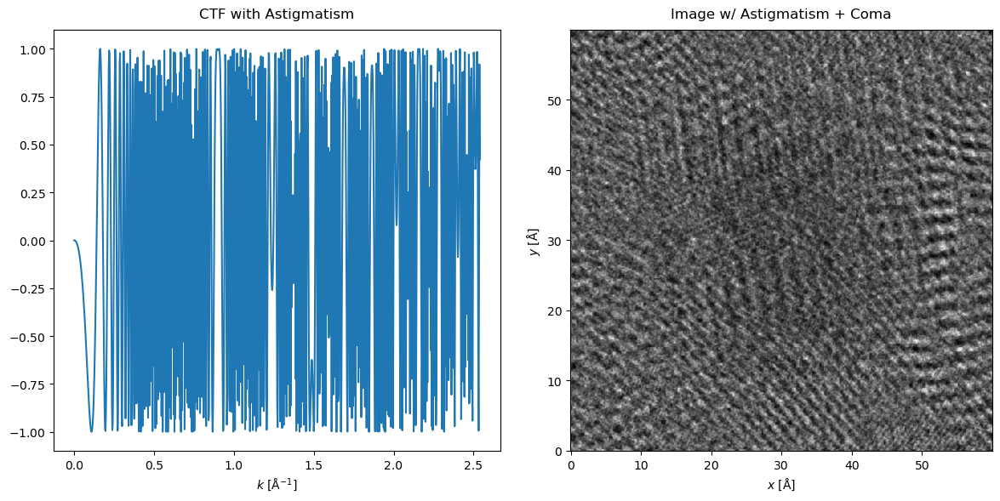

In [29]:
# Define CTF with 2-fold Astigmatism and Coma
ctf_aberrated = abtem.CTF(
    energy=300e3,
    C10=defocus,          # Defocus
    C12=200.0,            # 2-fold Astigmatism (Angstroms) - Exaggerated
    phi12=np.radians(30), # Astigmatism Angle
    C21=1.0e6,           # Axial Coma (Angstroms) - Exaggerated
    phi21=np.radians(0),
    C30=Cs,               # Spherical Aberration
)

# Apply CTF
image_aberrated = exit_wave.apply_ctf(ctf_aberrated)
intensity_aberrated = image_aberrated.intensity()

# Plot CTF (Passon) and Image
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Show CTF 2D Phase plate (Scherzer/Thon rings visualization)
# We calculate the CTF function on a grid
ctf_aberrated.profiles().show(ax=ax[0], title="CTF with Astigmatism")

# Show Image
intensity_aberrated.show(ax=ax[1], cmap='gray', title="Image w/ Astigmatism + Coma")
plt.tight_layout()